# VENDO A QUALIDADE DO VINHO

## IMPORTANDO AS BIBLIOTECAS

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
!pip install pycaret
!pip install pandas_profiling
!pip install tpot

     |████████████████████████████████| 256kB 3.4MB/s 
     |████████████████████████████████| 102kB 5.5MB/s 
     |████████████████████████████████| 266kB 10.3MB/s 
     |████████████████████████████████| 174kB 11.1MB/s 
     |████████████████████████████████| 1.8MB 18.0MB/s 
     |████████████████████████████████| 66.1MB 52kB/s 
     |████████████████████████████████| 6.8MB 34.1MB/s 
     |████████████████████████████████| 1.6MB 43.6MB/s 
     |████████████████████████████████| 266kB 41.8MB/s 
     |████████████████████████████████| 13.9MB 324kB/s 
     |████████████████████████████████| 2.1MB 42.9MB/s 
     |████████████████████████████████| 71kB 7.4MB/s 
     |████████████████████████████████| 71kB 8.2MB/s 
     |████████████████████████████████| 71kB 7.6MB/s 
     |████████████████████████████████| 604kB 44.5MB/s 
     |████████████████████████████████| 3.1MB 37.7MB/s 
     |████████████████████████████████| 1.1MB 39.7MB/s 
     |████████████████████████████████| 163kB 47.6MB/s 
 

## Lendo o dataset

In [3]:
wine = pd.read_csv('winequality-red.csv')

In [5]:
#vendo as primeiras posições
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [6]:
#trocar o nome das colunas
wine.columns = ['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar', 'chlorides', 'free_SO2', 'total_SO2', 'density', 'pH', 'sulphates', 'alcohol', 'quality']

In [7]:
wine

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_SO2,total_SO2,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [9]:
#tamanho do dataset
wine.shape

(1599, 12)

In [10]:
#info
wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   fixed_acidity     1599 non-null   float64
 1   volatile_acidity  1599 non-null   float64
 2   citric_acid       1599 non-null   float64
 3   residual_sugar    1599 non-null   float64
 4   chlorides         1599 non-null   float64
 5   free_SO2          1599 non-null   float64
 6   total_SO2         1599 non-null   float64
 7   density           1599 non-null   float64
 8   pH                1599 non-null   float64
 9   sulphates         1599 non-null   float64
 10  alcohol           1599 non-null   float64
 11  quality           1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [11]:
#describe
wine.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_SO2,total_SO2,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [12]:
corr = wine.corr()

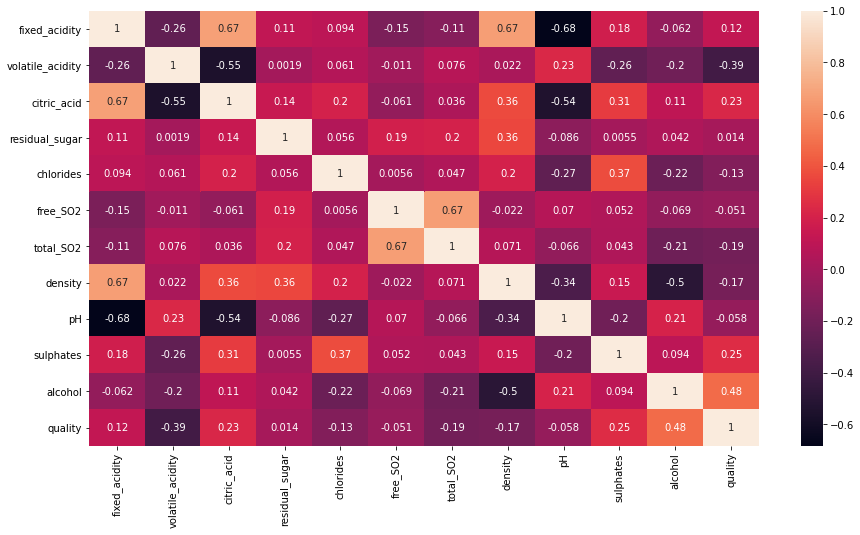

In [14]:
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=True);


In [17]:
#variável alvo
wine.quality.unique()

array([5, 6, 7, 4, 8, 3])

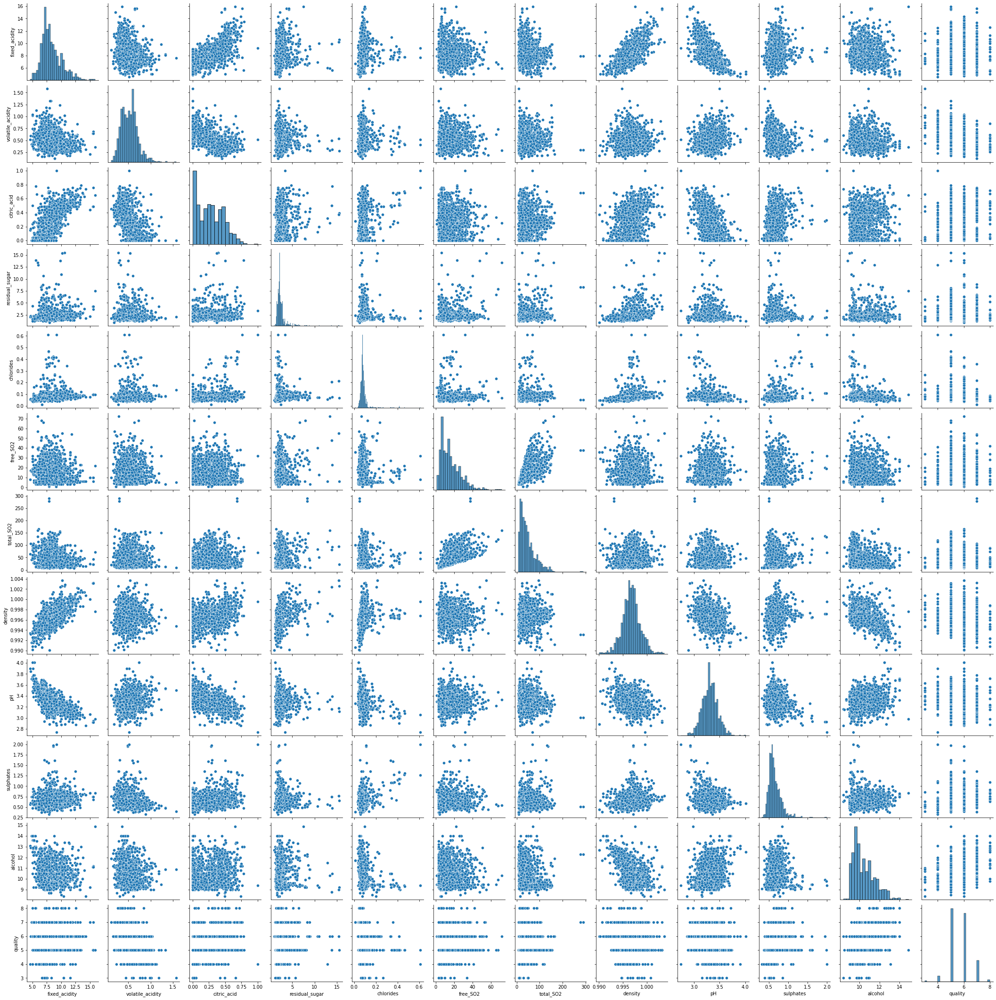

In [16]:
sns.pairplot(wine)

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


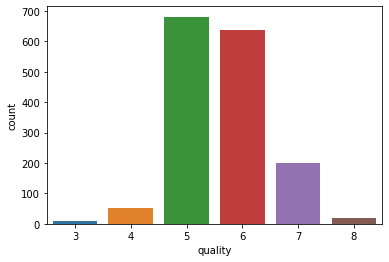

In [19]:
#distribuição da variável alvo
sns.countplot(wine.quality);

In [20]:
dados = wine.copy()

In [27]:
#criando uma coluna com um target binarizado usando o pandas cut (até 6 = 0, acima de 7 = 1)
dados['qualidade'] = pd.cut(dados.quality, bins=[0,6,8], labels=[0,1])

In [28]:
dados.sample(20)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_SO2,total_SO2,density,pH,sulphates,alcohol,quality,qualidade
974,8.8,0.330,0.41,5.9,0.073,7.0,13.0,0.99658,3.30,0.62,12.1,7,1
556,10.9,0.530,0.49,4.6,0.118,10.0,17.0,1.00020,3.07,0.56,11.7,6,0
658,7.2,0.520,0.07,1.4,0.074,5.0,20.0,0.99730,3.32,0.81,9.6,6,0
614,9.2,0.755,0.18,2.2,0.148,10.0,103.0,0.99690,2.87,1.36,10.2,6,0
1459,7.9,0.200,0.35,1.7,0.054,7.0,15.0,0.99458,3.32,0.80,11.9,7,1
156,7.1,0.430,0.42,5.5,0.070,29.0,129.0,0.99730,3.42,0.72,10.5,5,0
1403,7.2,0.330,0.33,1.7,0.061,3.0,13.0,0.99600,3.23,1.10,10.0,8,1
568,9.8,0.500,0.49,2.6,0.250,5.0,20.0,0.99900,3.31,0.79,10.7,6,0
1251,7.5,0.580,0.14,2.2,0.077,27.0,60.0,0.99630,3.28,0.59,9.8,5,0
597,11.9,0.580,0.58,1.9,0.071,5.0,18.0,0.99800,3.09,0.63,10.0,6,0


In [29]:
dados.loc[dados.qualidade == 1]

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_SO2,total_SO2,density,pH,sulphates,alcohol,quality,qualidade
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.99460,3.39,0.47,10.00,7,1
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.99680,3.36,0.57,9.50,7,1
16,8.5,0.28,0.56,1.8,0.092,35.0,103.0,0.99690,3.30,0.75,10.50,7,1
37,8.1,0.38,0.28,2.1,0.066,13.0,30.0,0.99680,3.23,0.73,9.70,7,1
62,7.5,0.52,0.16,1.9,0.085,12.0,35.0,0.99680,3.38,0.62,9.50,7,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1541,7.4,0.25,0.29,2.2,0.054,19.0,49.0,0.99666,3.40,0.76,10.90,7,1
1544,8.4,0.37,0.43,2.3,0.063,12.0,19.0,0.99550,3.17,0.81,11.20,7,1
1549,7.4,0.36,0.30,1.8,0.074,17.0,24.0,0.99419,3.24,0.70,11.40,8,1
1555,7.0,0.56,0.17,1.7,0.065,15.0,24.0,0.99514,3.44,0.68,10.55,7,1


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


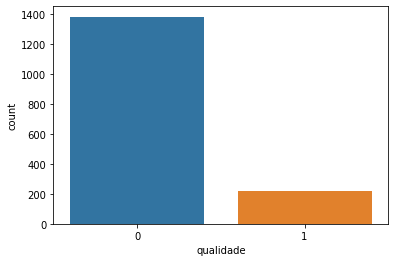

In [30]:
#verificando o balanceamento do alvo
sns.countplot(dados.qualidade);

## Usando o Pandas Profiling

In [35]:
#!pip install -U pandas-profiling

In [36]:
#importando o relatório da biblioteca
from pandas_profiling import ProfileReport


In [39]:
#criando o relatório
profile = ProfileReport(wine, explorative=True)

In [40]:
#visualizar dentro do notebook
profile.to_notebook_iframe()

Drop Duplicates

In [41]:
dados.drop_duplicates()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_SO2,total_SO2,density,pH,sulphates,alcohol,quality,qualidade
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,0
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,0
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,0
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1593,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,0
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,0
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,0


## Modelando os dados - Classificação

In [47]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

In [69]:
dtc = DecisionTreeClassifier()
dtc1 = DecisionTreeClassifier()

In [45]:
#dividir o dataset
X = dados.drop(['quality', 'qualidade'], axis=1)

In [46]:
y_multi = dados.quality
y_bi = dados.qualidade

In [48]:
X_train_m, X_test_m, y_train_m, y_test_m = train_test_split(X, y_multi, random_state = 42)
X_train_b, X_test_b, y_train_b, y_test_b = train_test_split(X, y_bi, random_state = 42)

### Classificação multi

In [70]:
dtc.fit(X_train_m, y_train_m)

DecisionTreeClassifier()

In [51]:
y_multi_pred = dtc.predict(X_test_m)

### Classificação binária

In [75]:
dtc1.fit(X_train_b, y_train_b)

DecisionTreeClassifier()

In [53]:
y_bi_pred = dtc1.predict(X_test_b)

### Avaliando os modelos base

In [54]:
from sklearn.metrics import classification_report

In [55]:
#modelo multi
print(classification_report(y_test_m, y_multi_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.12      0.15      0.13        13
           5       0.67      0.65      0.66       164
           6       0.62      0.55      0.58       169
           7       0.41      0.58      0.48        48
           8       0.00      0.00      0.00         5

    accuracy                           0.57       400
   macro avg       0.30      0.32      0.31       400
weighted avg       0.59      0.57      0.58       400



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [56]:
#modelo bi
print(classification_report(y_test_b, y_bi_pred))

              precision    recall  f1-score   support

           0       0.95      0.93      0.94       347
           1       0.59      0.70      0.64        53

    accuracy                           0.90       400
   macro avg       0.77      0.81      0.79       400
weighted avg       0.90      0.90      0.90       400



In [71]:
importance1 = dtc.feature_importances_

In [73]:
for feature, dtc in zip(features,importance1):
  print([feature, dtc])
  

['fixed_acidity', 0.07246871126319282]
['volatile_acidity', 0.11990718430691288]
['citric_acid', 0.06811725716103516]
['residual_sugar', 0.06608860896137524]
['chlorides', 0.05922790673965506]
['free_SO2', 0.042088046873912606]
['total_SO2', 0.12595989241388889]
['density', 0.059237261096794606]
['pH', 0.07206866663404463]
['sulphates', 0.11755655068384693]
['alcohol', 0.19727991386534127]


In [76]:
importance2 = dtc1.feature_importances_

In [77]:
for feature, dtc in zip(features,importance2):
  print([feature, dtc])

['fixed_acidity', 0.05480067254412568]
['volatile_acidity', 0.10210273634566037]
['citric_acid', 0.041344222132519176]
['residual_sugar', 0.065755693734]
['chlorides', 0.05658480888896412]
['free_SO2', 0.07757880775613436]
['total_SO2', 0.1053786977853758]
['density', 0.06842424318332167]
['pH', 0.05982853340135064]
['sulphates', 0.14381280098223098]
['alcohol', 0.22438878324631714]


## Otimizar os dados para um modelo binário

In [78]:
#balanceamento de classes
from imblearn.over_sampling import SVMSMOTE

In [79]:
smote = SVMSMOTE()

In [80]:
X_train,y_train = smote.fit_resample(X_train_b, y_train_b)

In [81]:
dtc1.fit(X_train,y_train)

DecisionTreeClassifier()

In [82]:
y_smote = dtc1.predict(X_test_b)

In [83]:
print(classification_report(y_test_b, y_smote))

              precision    recall  f1-score   support

           0       0.96      0.87      0.92       347
           1       0.48      0.79      0.60        53

    accuracy                           0.86       400
   macro avg       0.72      0.83      0.76       400
weighted avg       0.90      0.86      0.87       400



## Padronização dos dados

In [84]:
from sklearn.preprocessing import MinMaxScaler

In [85]:
mms = MinMaxScaler()

In [89]:
X_mms_train = mms.fit_transform(X_train)

In [88]:
X_mms_test = mms.transform(X_test_b)

In [90]:
dtc1.fit(X_mms_train, y_train)

DecisionTreeClassifier()

In [91]:
y_mms_pred = dtc1.predict(X_mms_test)

In [92]:
print(classification_report(y_test_b, y_mms_pred))

              precision    recall  f1-score   support

           0       0.96      0.88      0.92       347
           1       0.49      0.77      0.60        53

    accuracy                           0.86       400
   macro avg       0.73      0.82      0.76       400
weighted avg       0.90      0.86      0.87       400



### Pycaret

In [93]:
from pycaret.classification import *

In [94]:
setup(data = dados.drop('quality', axis=1), target='qualidade')

Setup Succesfully Completed!


,Description,Value
0,session_id,7052
1,Target Type,Binary
2,Label Encoded,"0: 0, 1: 1"
3,Original Data,"(1599, 12)"
4,Missing Values,False
5,Numeric Features,11
6,Categorical Features,0
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


(      fixed_acidity  volatile_acidity  citric_acid  ...    pH  sulphates  alcohol
 0               7.4             0.700         0.00  ...  3.51       0.56      9.4
 1               7.8             0.880         0.00  ...  3.20       0.68      9.8
 2               7.8             0.760         0.04  ...  3.26       0.65      9.8
 3              11.2             0.280         0.56  ...  3.16       0.58      9.8
 4               7.4             0.700         0.00  ...  3.51       0.56      9.4
 ...             ...               ...          ...  ...   ...        ...      ...
 1594            6.2             0.600         0.08  ...  3.45       0.58     10.5
 1595            5.9             0.550         0.10  ...  3.52       0.76     11.2
 1596            6.3             0.510         0.13  ...  3.42       0.75     11.0
 1597            5.9             0.645         0.12  ...  3.57       0.71     10.2
 1598            6.0             0.310         0.47  ...  3.39       0.66     11.0
 
 [

In [95]:
compare_models(sort='AUC')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
0,Extra Trees Classifier,0.9062,0.9164,0.4400,0.7839,0.5576,0.5101,0.5396,0.2506
1,Light Gradient Boosting Machine,0.9026,0.8990,0.5058,0.7187,0.5870,0.5337,0.5480,0.0888
2,CatBoost Classifier,0.9000,0.8989,0.4533,0.7085,0.5504,0.4974,0.5144,2.1088
3,Extreme Gradient Boosting,0.8892,0.8830,0.4142,0.6512,0.5001,0.4424,0.4594,0.0835
4,Gradient Boosting Classifier,0.8883,0.8824,0.4267,0.6535,0.5084,0.4490,0.4660,0.2577
5,Linear Discriminant Analysis,0.8696,0.8693,0.3479,0.5529,0.4182,0.3497,0.3660,0.0075
6,Random Forest Classifier,0.8910,0.8643,0.3821,0.6847,0.4838,0.4291,0.4550,0.1123
7,Logistic Regression,0.8714,0.8594,0.2100,0.5561,0.3000,0.2472,0.2842,0.0583
8,Ada Boost Classifier,0.8749,0.8549,0.3879,0.5525,0.4497,0.3833,0.3933,0.1270
9,Quadratic Discriminant Analysis,0.8338,0.8415,0.5712,0.4262,0.4819,0.3869,0.3966,0.0067


ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=7052, verbose=0,
                     warm_start=False)

In [97]:
etc = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9018,0.9127,0.4667,0.7000,0.5600,0.5072,0.5204
1,0.8839,0.8784,0.3333,0.6250,0.4348,0.3767,0.3999
2,0.9107,0.9323,0.3333,1.0000,0.5000,0.4641,0.5497
3,0.9018,0.9247,0.4667,0.7000,0.5600,0.5072,0.5204
4,0.8929,0.9560,0.3333,0.7143,0.4545,0.4037,0.4400
5,0.9018,0.8777,0.4667,0.7000,0.5600,0.5072,0.5204
6,0.9196,0.9351,0.5333,0.8000,0.6400,0.5968,0.6124
7,0.9107,0.8968,0.5000,0.8000,0.6154,0.5679,0.5880
8,0.9107,0.8815,0.5000,0.8000,0.6154,0.5679,0.5880
9,0.9279,0.9691,0.4667,1.0000,0.6364,0.6022,0.6563


In [99]:
etc_tunado = tune_model(etc)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8661,0.8144,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.8661,0.7526,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.8661,0.9168,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.8661,0.9306,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.8661,0.8749,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.8661,0.8296,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.8661,0.8694,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.8571,0.8529,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.8571,0.8132,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.8649,0.9319,0.0000,0.0000,0.0000,0.0000,0.0000


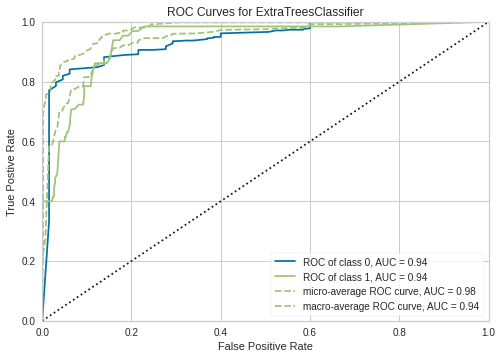

In [101]:
plot_model(etc)

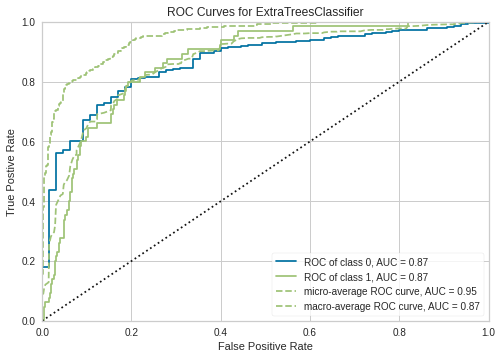

In [102]:
plot_model(etc_tunado)

TPOT

In [103]:
from tpot import TPOTClassifier

In [104]:
tpot = TPOTClassifier(generations=5, verbosity=2)

In [105]:
tpot.fit(X_train_b, y_train_b)


Generation 1 - Current best internal CV score: 0.9065969316596931
Generation 2 - Current best internal CV score: 0.9107670850767086
Generation 3 - Current best internal CV score: 0.9107670850767086
Generation 4 - Current best internal CV score: 0.9116073919107391
Generation 5 - Current best internal CV score: 0.9116073919107391
Best pipeline: ExtraTreesClassifier(RandomForestClassifier(input_matrix, bootstrap=False, criterion=gini, max_features=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100), bootstrap=True, criterion=gini, max_features=0.25, min_samples_leaf=10, min_samples_split=6, n_estimators=100)


TPOTClassifier(config_dict=None, crossover_rate=0.1, cv=5,
               disable_update_check=False, early_stop=None, generations=5,
               log_file=<ipykernel.iostream.OutStream object at 0x7f24dfa6eb00>,
               max_eval_time_mins=5, max_time_mins=None, memory=None,
               mutation_rate=0.9, n_jobs=1, offspring_size=None,
               periodic_checkpoint_folder=None, population_size=100,
               random_state=None, scoring=None, subsample=1.0, template=None,
               use_dask=False, verbosity=2, warm_start=False)

In [106]:
tpot.export('tpot_wine.py')

In [107]:
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.pipeline import make_pipeline, make_union
from tpot.builtins import StackingEstimator

# Average CV score on the training set was: 0.9116073919107391
exported_pipeline = make_pipeline(
    StackingEstimator(estimator=RandomForestClassifier(bootstrap=False, criterion="gini", max_features=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100)),
    ExtraTreesClassifier(bootstrap=True, criterion="gini", max_features=0.25, min_samples_leaf=10, min_samples_split=6, n_estimators=100)
)

exported_pipeline.fit(X_train_b, y_train_b)
results = exported_pipeline.predict(X_test_b)

In [108]:
print(classification_report(y_test_b, results))

              precision    recall  f1-score   support

           0       0.94      0.97      0.95       347
           1       0.73      0.57      0.64        53

    accuracy                           0.92       400
   macro avg       0.83      0.77      0.80       400
weighted avg       0.91      0.92      0.91       400

